# Imports


In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.metrics import CategoricalAccuracy, TopKCategoricalAccuracy, Precision, Recall
import os

# Load Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
!unzip /content/drive/Shareddrives/ML/MLP/train.zip > /dev/null
!unzip /content/drive/Shareddrives/ML/MLP/test.zip > /dev/null
!unzip /content/drive/Shareddrives/ML/MLP/val.zip > /dev/null

In [4]:
train_path = '/content/train'
val_path = '/content/val'
test_path = '/content/test'


BATCH_SIZE = 64
train_datagen = ImageDataGenerator(rescale=1./255,
        # shear_range=0.2,
        # rotation_range=20.,
        # width_shift_range=0.1,
        # height_shift_range=0.1,
        # zoom_range=[0.9, 1.25],
        # brightness_range=[0.5, 1.5],
        horizontal_flip=True).flow_from_directory(train_path, 
                                                  target_size=(224, 224), 
                                                  color_mode="rgb", 
                                                  batch_size=BATCH_SIZE, 
                                                  class_mode='categorical', 
                                                  shuffle=True, 
                                                  seed=1)
val_datagen = ImageDataGenerator(rescale=1./255,
        # shear_range=0.2,
        # rotation_range=20.,
        # width_shift_range=0.1,
        # height_shift_range=0.1,
        # zoom_range=[0.9, 1.25],
        # brightness_range=[0.5, 1.5],
        horizontal_flip=True).flow_from_directory(val_path, 
                                                  target_size=(224, 224), 
                                                  color_mode="rgb", 
                                                  batch_size=BATCH_SIZE, 
                                                  class_mode='categorical', 
                                                  shuffle=True, 
                                                  seed=1)

test_datagen = ImageDataGenerator(rescale=1./255).flow_from_directory(test_path, 
                                                        target_size=(224, 224), 
                                                        color_mode="rgb", 
                                                        batch_size=BATCH_SIZE, 
                                                        class_mode='categorical', 
                                                        shuffle=False, 
                                                        seed=1)

Found 12997 images belonging to 196 classes.
Found 1629 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


# MLP Models

## MLP Model 1 <br>

2 Hidden Layers <br>
128 neurons each layer<br>
Adam Optimizer with 0.001 Learning Rate

In [ ]:
STEP_SIZE_TRAIN = train_datagen.n // train_datagen.batch_size
STEP_SIZE_VALID = val_datagen.n // val_datagen.batch_size
import tensorflow
earlystopping = tensorflow.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 min_delta = 1e-4,
                                                 patience = 5,
                                                 mode = 'max',
                                                 restore_best_weights = True,
                                                 verbose = 1)
lr_reduce = tensorflow.keras.callbacks.ReduceLROnPlateau(monitor='val_accuracy', factor=0.6, patience=8, verbose=1, mode='max', min_lr=0.0001)

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(128, activation=tf.nn.relu),#Hidden Layer 1 definition
    tf.keras.layers.Dense(128, activation=tf.nn.relu),#Hidden Layer 2 definition
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])

In [ ]:
print (model.summary())

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_6 (Flatten)         (None, 150528)            0         
                                                                 
 dense_25 (Dense)            (None, 128)               19267712  
                                                                 
 dense_26 (Dense)            (None, 128)               16512     
                                                                 
 dense_27 (Dense)            (None, 196)               25284     
                                                                 
Total params: 19,309,508
Trainable params: 19,309,508
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

In [ ]:
history = model.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 77s 377ms/step - loss: 8.0386 - accuracy: 0.0066 - val_loss: 5.2771 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 2/20
203/203 [==============================] - 76s 376ms/step - loss: 5.2772 - accuracy: 0.0083 - val_loss: 5.2761 - val_accuracy: 0.0081 - lr: 0.0010
Epoch 3/20
203/203 [==============================] - 76s 377ms/step - loss: 5.2761 - accuracy: 0.0084 - val_loss: 5.2749 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 4/20
203/203 [==============================] - 74s 366ms/step - loss: 5.2753 - accuracy: 0.0083 - val_loss: 5.2743 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 5/20
203/203 [==============================] - 77s 378ms/step - loss: 5.2746 - accuracy: 0.0084 - val_loss: 5.2737 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 6/20
203/203 [==============================] - 79s 387ms/step - loss: 5.2741 - accuracy: 0.0084 - val_loss: 5.2734 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 6: early stopping


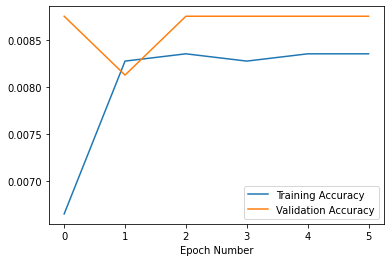

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history.history['accuracy'],label='Training Accuracy')
plt.plot(history.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

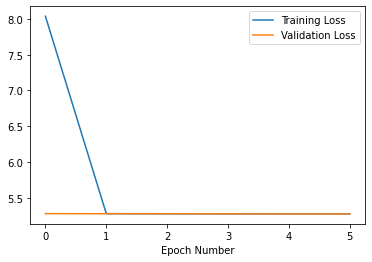

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history.history['loss'],label='Training Loss')
plt.plot(history.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_results = model.evaluate(test_datagen)


print("Categorical_Accuracy: ", model_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_results[2])
if (model_results[4] + model_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_results[4] * model_results[3] / (model_results[4] + model_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 40s 312ms/step - loss: 5.2772 - categorical_accuracy: 0.0085 - top_k_categorical_accuracy: 0.0203 - recall_6: 0.0000e+00 - precision_6: 0.0000e+00
Categorical_Accuracy:  0.008456659503281116
Top_K_Categorical_Accuracy(k=3):  0.02027111127972603
F1-score:  0


In [ ]:
model.save('/content/drive/Shareddrives/ML/MLP/model_1')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_1/assets


In [ ]:
model = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_1')

In [ ]:
model.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_results = model.evaluate(train_datagen)


print("Categorical_Accuracy: ", model_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_results[2])
if (model_results[4] + model_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_results[4] * model_results[3] / (model_results[4] + model_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 72s 334ms/step - loss: 5.2769 - categorical_accuracy: 0.0083 - top_k_categorical_accuracy: 0.0202 - recall: 0.0000e+00 - precision: 0.0000e+00
Categorical_Accuracy:  0.008309610188007355
Top_K_Categorical_Accuracy(k=3):  0.020158497616648674
F1-score:  0


In [ ]:
model.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_results = model.evaluate(val_datagen)


print("Categorical_Accuracy: ", model_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_results[2])
if (model_results[4] + model_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_results[4] * model_results[3] / (model_results[4] + model_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 9s 322ms/step - loss: 5.2770 - categorical_accuracy: 0.0086 - top_k_categorical_accuracy: 0.0209 - recall_1: 0.0000e+00 - precision_1: 0.0000e+00
Categorical_Accuracy:  0.008594229817390442
Top_K_Categorical_Accuracy(k=3):  0.02087170071899891
F1-score:  0


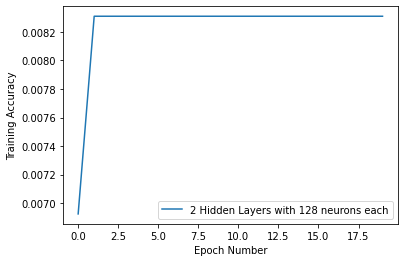

In [ ]:
plt.xlabel('Epoch Number')
plt.ylabel("Training Accuracy")
plt.plot(history.history['accuracy'],label='2 Hidden Layers with 128 neurons each')
plt.legend()

**Round 1 experiment**:<br>
Severe underfitting occurs, loss remains high after every epochs, accuracy remains low every epochs(stagnent). Model is not learning.

## MLP Model 2 <br>
Incrase 2 more hidden layers(from 2 to 4) <br>
Increase neurons numbers for each layer(128 to 512)<br>
Adam optimizer with 0.001 learning rate


In [ ]:
model_2 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 1 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 2 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 3 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 4 definition
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])

In [ ]:
print (model_2.summary())

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_4 (Flatten)         (None, 150528)            0         
                                                                 
 dense_17 (Dense)            (None, 512)               77070848  
                                                                 
 dense_18 (Dense)            (None, 512)               262656    
                                                                 
 dense_19 (Dense)            (None, 512)               262656    
                                                                 
 dense_20 (Dense)            (None, 512)               262656    
                                                                 
 dense_21 (Dense)            (None, 196)               100548    
                                                                 
Total params: 77,959,364
Trainable params: 77,959,364


In [ ]:
model_2.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

In [ ]:
history_2 = model_2.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 93s 454ms/step - loss: 9.1241 - accuracy: 0.0066 - val_loss: 5.3306 - val_accuracy: 0.0050 - lr: 0.0010
Epoch 2/20
203/203 [==============================] - 76s 376ms/step - loss: 5.2359 - accuracy: 0.0123 - val_loss: 5.1363 - val_accuracy: 0.0162 - lr: 0.0010
Epoch 3/20
203/203 [==============================] - 78s 384ms/step - loss: 5.1309 - accuracy: 0.0145 - val_loss: 5.0625 - val_accuracy: 0.0219 - lr: 0.0010
Epoch 4/20
203/203 [==============================] - 76s 375ms/step - loss: 5.0270 - accuracy: 0.0226 - val_loss: 5.0583 - val_accuracy: 0.0219 - lr: 0.0010
Epoch 5/20
203/203 [==============================] - 76s 375ms/step - loss: 4.9474 - accuracy: 0.0274 - val_loss: 4.9771 - val_accuracy: 0.0344 - lr: 0.0010
Epoch 6/20
203/203 [==============================] - 76s 376ms/step - loss: 4.8908 - accuracy: 0.0304 - val_loss: 4.9140 - val_accuracy: 0.0319 - lr: 0.0010
Epoch 7/20
203/203 [==============================] 

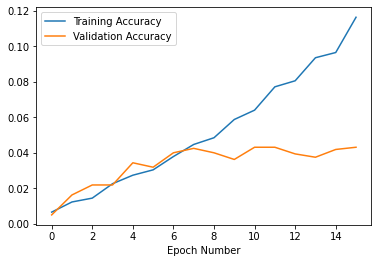

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_2.history['accuracy'],label='Training Accuracy')
plt.plot(history_2.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

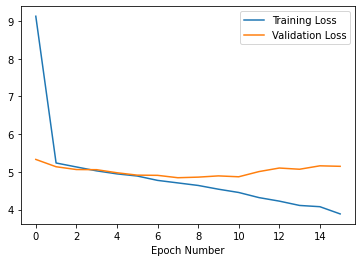

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_2.history['loss'],label='Training Loss')
plt.plot(history_2.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_2.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_2_results = model_2.evaluate(test_datagen)


print("Categorical_Accuracy: ", model_2_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_2_results[2])
if (model_2_results[4] + model_2_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_2_results[4] * model_2_results[3] / (model_2_results[4] + model_2_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 40s 311ms/step - loss: 4.8938 - categorical_accuracy: 0.0448 - top_k_categorical_accuracy: 0.1063 - recall_5: 0.0032 - precision_5: 0.2826
Categorical_Accuracy:  0.04477054998278618
Top_K_Categorical_Accuracy(k=3):  0.10633005946874619
F1-score:  0.006393704464098013


In [ ]:
model_2.save('/content/drive/Shareddrives/ML/MLP/model_2')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_2/assets


In [ ]:
model_2 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_2')

In [ ]:
model_2.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_2_results = model_2.evaluate(train_datagen)


print("Categorical_Accuracy: ", model_2_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_2_results[2])
if (model_2_results[4] + model_2_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_2_results[4] * model_2_results[3] / (model_2_results[4] + model_2_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 68s 334ms/step - loss: 4.2970 - categorical_accuracy: 0.0802 - top_k_categorical_accuracy: 0.1772 - recall_2: 0.0068 - precision_2: 0.5641
Categorical_Accuracy:  0.08024928718805313
Top_K_Categorical_Accuracy(k=3):  0.177194744348526
F1-score:  0.013380977903981394


In [ ]:
model_2.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_2_results = model_2.evaluate(val_datagen)


print("Categorical_Accuracy: ", model_2_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_2_results[2])
if (model_2_results[4] + model_2_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_2_results[4] * model_2_results[3] / (model_2_results[4] + model_2_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 10s 356ms/step - loss: 4.8714 - categorical_accuracy: 0.0473 - top_k_categorical_accuracy: 0.1050 - recall_3: 0.0012 - precision_3: 0.1250
Categorical_Accuracy:  0.04726826399564743
Top_K_Categorical_Accuracy(k=3):  0.10497237741947174
F1-score:  0.0024316109084702654


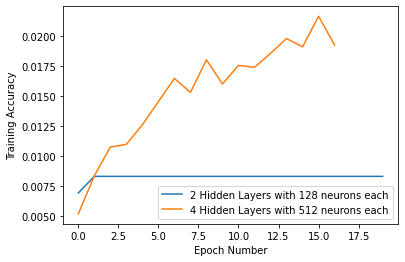

In [ ]:
plt.xlabel('Epoch Number')
plt.ylabel("Training Accuracy")
plt.plot(history.history['accuracy'],label='2 Hidden Layers with 128 neurons each')
plt.plot(history_2.history['accuracy'],label='4 Hidden Layers with 512 neurons each')
plt.legend()

**Round 2 Experiment:**
Accuracy improved from model 1. 
Improve layers and number of neurons help improved the accuracy 
Early Stopping happens.



## MLP Model 3<br>

Same stucture as Model 2<br>
Increase initial learning Rate from 0.001 to 0.01 <br>

In [ ]:
model_3 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 1 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 2 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 3 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 4 definition
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])

In [ ]:
print (model_3.summary())

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_3 (Flatten)         (None, 150528)            0         
                                                                 
 dense_12 (Dense)            (None, 512)               77070848  
                                                                 
 dense_13 (Dense)            (None, 512)               262656    
                                                                 
 dense_14 (Dense)            (None, 512)               262656    
                                                                 
 dense_15 (Dense)            (None, 512)               262656    
                                                                 
 dense_16 (Dense)            (None, 196)               100548    
                                                                 
Total params: 77,959,364
Trainable params: 77,959,364


In [ ]:
opt_3 = tf.keras.optimizers.Adam(learning_rate=0.01)
model_3.compile(loss="categorical_crossentropy", optimizer= opt_3, metrics=["accuracy"])

In [ ]:
history_3 = model_3.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 82s 403ms/step - loss: 5.3088 - accuracy: 0.0073 - val_loss: 5.2835 - val_accuracy: 0.0088 - lr: 0.0100
Epoch 2/20
203/203 [==============================] - 75s 369ms/step - loss: 5.2829 - accuracy: 0.0084 - val_loss: 5.2755 - val_accuracy: 0.0081 - lr: 0.0100
Epoch 3/20
203/203 [==============================] - 76s 374ms/step - loss: 5.2795 - accuracy: 0.0084 - val_loss: 5.2740 - val_accuracy: 0.0088 - lr: 0.0100
Epoch 4/20
203/203 [==============================] - 77s 378ms/step - loss: 5.2791 - accuracy: 0.0082 - val_loss: 5.2732 - val_accuracy: 0.0081 - lr: 0.0100
Epoch 5/20
203/203 [==============================] - 76s 376ms/step - loss: 5.2789 - accuracy: 0.0084 - val_loss: 5.2732 - val_accuracy: 0.0088 - lr: 0.0100
Epoch 6/20
203/203 [==============================] - 78s 383ms/step - loss: 5.2791 - accuracy: 0.0084 - val_loss: 5.2738 - val_accuracy: 0.0088 - lr: 0.0100
Epoch 6: early stopping


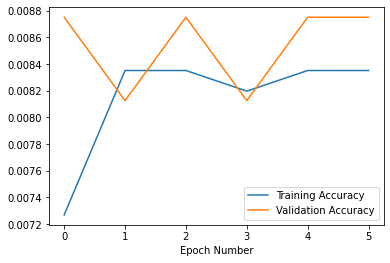

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_3.history['accuracy'],label='Training Accuracy')
plt.plot(history_3.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

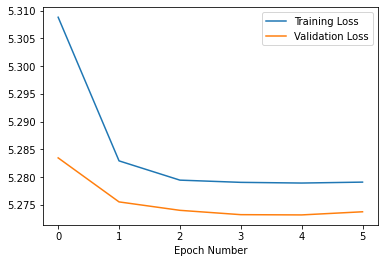

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_3.history['loss'],label='Training Loss')
plt.plot(history_3.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_3.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_3_results = model_3.evaluate(test_datagen)


print("Categorical_Accuracy: ", model_3_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_3_results[2])
if (model_3_results[4] + model_3_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_3_results[4] * model_3_results[3] / (model_3_results[4] + model_3_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 40s 315ms/step - loss: 5.2832 - categorical_accuracy: 0.0085 - top_k_categorical_accuracy: 0.0200 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00
Categorical_Accuracy:  0.008456659503281116
Top_K_Categorical_Accuracy(k=3):  0.020022384822368622
F1-score:  0


In [ ]:
model_3.save('/content/drive/Shareddrives/ML/MLP/model_3')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_3/assets


In [ ]:
model_3 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_3')

In [ ]:
model_3.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_3_results = model_3.evaluate(train_datagen)


print("Categorical_Accuracy: ", model_3_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_3_results[2])
if (model_3_results[4] + model_3_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_3_results[4] * model_3_results[3] / (model_3_results[4] + model_3_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 64s 312ms/step - loss: 5.2817 - categorical_accuracy: 0.0083 - top_k_categorical_accuracy: 0.0200 - recall_4: 0.0000e+00 - precision_4: 0.0000e+00
Categorical_Accuracy:  0.008309610188007355
Top_K_Categorical_Accuracy(k=3):  0.020004617050290108
F1-score:  0


In [ ]:
model_3.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_3_results = model_3.evaluate(val_datagen)


print("Categorical_Accuracy: ", model_3_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_3_results[2])
if (model_3_results[4] + model_3_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_3_results[4] * model_3_results[3] / (model_3_results[4] + model_3_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 8s 302ms/step - loss: 5.2829 - categorical_accuracy: 0.0086 - top_k_categorical_accuracy: 0.0203 - recall_5: 0.0000e+00 - precision_5: 0.0000e+00
Categorical_Accuracy:  0.008594229817390442
Top_K_Categorical_Accuracy(k=3):  0.020257826894521713
F1-score:  0


**Round 3 Experment:**
Early Stopping reach at epoch 6, bad learning rate occurs. Model not learning.
A learning rate of 0.01 is not suitable in this case. 

## MLP Model 4 

MLP without hidden layers<br>
Adam optimizer with 0.001 learning rate.

In [ ]:
model_4 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])
print(model_4.summary())

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_7 (Flatten)         (None, 150528)            0         
                                                                 
 dense_28 (Dense)            (None, 196)               29503684  
                                                                 
Total params: 29,503,684
Trainable params: 29,503,684
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
model_4.compile(loss="categorical_crossentropy", optimizer= 'adam', metrics=["accuracy"])

In [ ]:
history_4 = model_4.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 91s 446ms/step - loss: 212.8730 - accuracy: 0.0153 - val_loss: 84.5876 - val_accuracy: 0.0200 - lr: 0.0010
Epoch 2/20
203/203 [==============================] - 78s 383ms/step - loss: 80.5376 - accuracy: 0.0516 - val_loss: 74.8699 - val_accuracy: 0.0225 - lr: 0.0010
Epoch 3/20
203/203 [==============================] - 76s 372ms/step - loss: 66.4925 - accuracy: 0.0811 - val_loss: 79.9235 - val_accuracy: 0.0231 - lr: 0.0010
Epoch 4/20
203/203 [==============================] - 76s 373ms/step - loss: 60.6024 - accuracy: 0.1189 - val_loss: 72.5844 - val_accuracy: 0.0250 - lr: 0.0010
Epoch 5/20
203/203 [==============================] - 76s 372ms/step - loss: 57.5275 - accuracy: 0.1390 - val_loss: 64.1317 - val_accuracy: 0.0262 - lr: 0.0010
Epoch 6/20
203/203 [==============================] - 75s 372ms/step - loss: 46.2400 - accuracy: 0.1799 - val_loss: 66.7504 - val_accuracy: 0.0325 - lr: 0.0010
Epoch 7/20
203/203 [===================

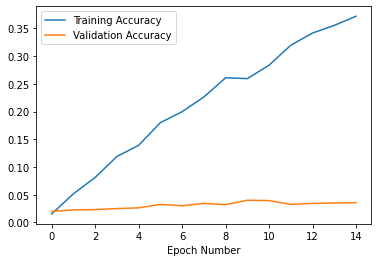

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_4.history['accuracy'],label='Training Accuracy')
plt.plot(history_4.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

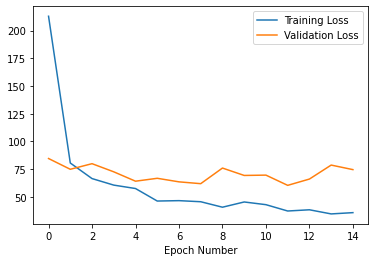

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_4.history['loss'],label='Training Loss')
plt.plot(history_4.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_4.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_4_results = model_4.evaluate(test_datagen)


print("Categorical_Accuracy: ", model_4_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_4_results[2])
if (model_4_results[4] + model_4_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_4_results[4] * model_4_results[3] / (model_4_results[4] + model_4_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 40s 313ms/step - loss: 69.4360 - categorical_accuracy: 0.0423 - top_k_categorical_accuracy: 0.0843 - recall_7: 0.0414 - precision_7: 0.0428
Categorical_Accuracy:  0.04228329658508301
Top_K_Categorical_Accuracy(k=3):  0.08431787043809891
F1-score:  0.042114582797603314


In [ ]:
model_4.save('/content/drive/Shareddrives/ML/MLP/model_4')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_4/assets


In [ ]:
model_4 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_4')

In [ ]:
model_4.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_4_results = model_4.evaluate(train_datagen)


print("Categorical_Accuracy: ", model_4_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_4_results[2])
if (model_4_results[4] + model_4_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_4_results[4] * model_4_results[3] / (model_4_results[4] + model_4_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 64s 310ms/step - loss: 29.4000 - categorical_accuracy: 0.4509 - top_k_categorical_accuracy: 0.5938 - recall_6: 0.4501 - precision_6: 0.4549
Categorical_Accuracy:  0.4508732855319977
Top_K_Categorical_Accuracy(k=3):  0.593752384185791
F1-score:  0.45248869833166616


In [ ]:
model_4.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_4_results = model_4.evaluate(val_datagen)


print("Categorical_Accuracy: ", model_4_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_4_results[2])
if (model_4_results[4] + model_4_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_4_results[4] * model_4_results[3] / (model_4_results[4] + model_4_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 9s 321ms/step - loss: 76.8111 - categorical_accuracy: 0.0344 - top_k_categorical_accuracy: 0.0749 - recall_7: 0.0344 - precision_7: 0.0348
Categorical_Accuracy:  0.03437691926956177
Top_K_Categorical_Accuracy(k=3):  0.0748925730586052
F1-score:  0.03461063118709416


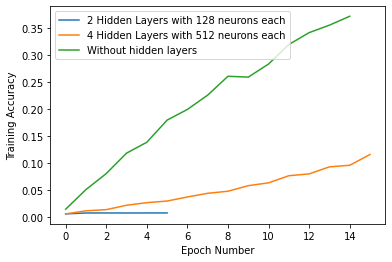

In [ ]:
plt.xlabel('Epoch Number')
plt.ylabel("Training Accuracy")
plt.plot(history.history['accuracy'],label='2 Hidden Layers with 128 neurons each')
plt.plot(history_2.history['accuracy'],label='4 Hidden Layers with 512 neurons each')
plt.plot(history_4.history['accuracy'],label='Without hidden layers')
plt.legend()

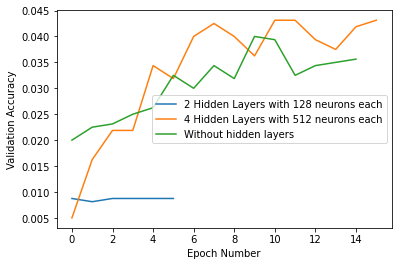

In [ ]:
plt.xlabel('Epoch Number')
plt.ylabel("Validation Accuracy")
plt.plot(history.history['val_accuracy'],label='2 Hidden Layers with 128 neurons each')
plt.plot(history_2.history['val_accuracy'],label='4 Hidden Layers with 512 neurons each')
plt.plot(history_4.history['val_accuracy'],label='Without hidden layers')
plt.legend()

In [ ]:
model_4.evaluate(x=test_datagen)[1]

126/126 [==============================] - 33s 264ms/step - loss: 76378.4531 - accuracy: 0.0336


0.03357791155576706

**Round 4 Experiment:**
MLP without hidden layers has a higher training and validation accuracy compared to MLP with 2 and 4 hidden layers.

The training accuracy keeps increasing but the validation accuracy keeps fluctuating. 


## MLP Model 5<br>

1 hidden layer <br>
2048 neurons for that layer <br>
Adam optimizer with 0.001 learning rate

In [ ]:
model_5 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(2048, activation=tf.nn.relu),#Hidden Layer 1 definition
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])
print(model_5.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 150528)            0         
                                                                 
 dense_10 (Dense)            (None, 2048)              308283392 
                                                                 
 dense_11 (Dense)            (None, 196)               401604    
                                                                 
Total params: 308,684,996
Trainable params: 308,684,996
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
model_5.compile(loss="categorical_crossentropy", optimizer= 'adam', metrics=["accuracy"])

In [ ]:
history_5 = model_5.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 104s 510ms/step - loss: 65.9145 - accuracy: 0.0051 - val_loss: 5.2777 - val_accuracy: 0.0056 - lr: 0.0010
Epoch 2/20
203/203 [==============================] - 83s 411ms/step - loss: 5.2914 - accuracy: 0.0056 - val_loss: 5.2771 - val_accuracy: 0.0056 - lr: 0.0010
Epoch 3/20
203/203 [==============================] - 81s 399ms/step - loss: 5.2948 - accuracy: 0.0052 - val_loss: 5.2764 - val_accuracy: 0.0050 - lr: 0.0010
Epoch 4/20
203/203 [==============================] - 82s 404ms/step - loss: 5.2771 - accuracy: 0.0049 - val_loss: 5.2758 - val_accuracy: 0.0056 - lr: 0.0010
Epoch 5/20
203/203 [==============================] - 82s 403ms/step - loss: 5.2753 - accuracy: 0.0055 - val_loss: 5.2753 - val_accuracy: 0.0050 - lr: 0.0010
Epoch 6/20
203/203 [==============================] - 83s 407ms/step - loss: 5.2751 - accuracy: 0.0083 - val_loss: 5.2749 - val_accuracy: 0.0088 - lr: 0.0010
Epoch 7/20
203/203 [==============================

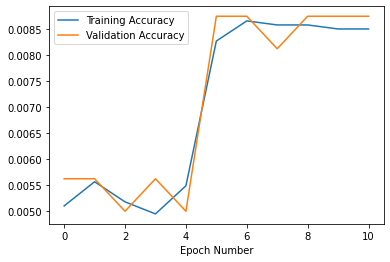

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_5.history['accuracy'],label='Training Accuracy')
plt.plot(history_5.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

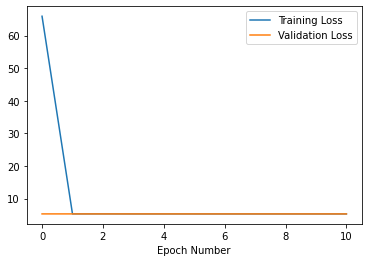

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_5.history['loss'],label='Training Loss')
plt.plot(history_5.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_5.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_5_results = model_5.evaluate(test_datagen)


print("Categorical_Accuracy: ", model_5_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_5_results[2])
if (model_5_results[4] + model_5_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_5_results[4] * model_5_results[3] / (model_5_results[4] + model_5_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 41s 326ms/step - loss: 5.2751 - categorical_accuracy: 0.0085 - top_k_categorical_accuracy: 0.0199 - recall_3: 0.0000e+00 - precision_3: 0.0000e+00
Categorical_Accuracy:  0.008456659503281116
Top_K_Categorical_Accuracy(k=3):  0.019898023456335068
F1-score:  0


In [ ]:
model_5.save('/content/drive/Shareddrives/ML/MLP/model_5')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_5/assets


In [ ]:
model_5 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_5')

In [ ]:
model_5.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_5_results = model_5.evaluate(train_datagen)


print("Categorical_Accuracy: ", model_5_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_5_results[2])
if (model_5_results[4] + model_5_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_5_results[4] * model_5_results[3] / (model_5_results[4] + model_5_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 69s 338ms/step - loss: 5.2740 - categorical_accuracy: 0.0085 - top_k_categorical_accuracy: 0.0202 - recall_8: 7.6941e-05 - precision_8: 1.0000
Categorical_Accuracy:  0.008463491685688496
Top_K_Categorical_Accuracy(k=3):  0.020158497616648674
F1-score:  0.00015386981888080472


In [ ]:
model_5.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_5_results = model_5.evaluate(val_datagen)


print("Categorical_Accuracy: ", model_5_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_5_results[2])
if (model_5_results[4] + model_5_results[3] == 0):
  f1 = 0
else:
  f1 = 2 * model_5_results[4] * model_5_results[3] / (model_5_results[4] + model_5_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 9s 325ms/step - loss: 5.2749 - categorical_accuracy: 0.0086 - top_k_categorical_accuracy: 0.0196 - recall_9: 0.0000e+00 - precision_9: 0.0000e+00
Categorical_Accuracy:  0.008594229817390442
Top_K_Categorical_Accuracy(k=3):  0.019643953070044518
F1-score:  0


**Round 5 Experiment:** Model not learning (both training accuracy and validation accuracy remains stagnant), early stopping occurs.

## MLP Model 6

6 Hidden Layers<br>
512 neurons each layers<br>
Adam optimizer with 0.001 learning rate

In [ ]:
model_12 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(224, 224, 3)), #input layer to convert 2 D array to 1D array
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 1 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 2 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 3 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 4 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 5 definition
    tf.keras.layers.Dense(512, activation=tf.nn.relu),#Hidden Layer 6 definition
    tf.keras.layers.Dense(196, activation=tf.nn.softmax) #output layer definition
])

In [ ]:
print(model_12.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 150528)            0         
                                                                 
 dense_3 (Dense)             (None, 512)               77070848  
                                                                 
 dense_4 (Dense)             (None, 512)               262656    
                                                                 
 dense_5 (Dense)             (None, 512)               262656    
                                                                 
 dense_6 (Dense)             (None, 512)               262656    
                                                                 
 dense_7 (Dense)             (None, 512)               262656    
                                                                 
 dense_8 (Dense)             (None, 512)              

In [ ]:
model_12.compile(loss="categorical_crossentropy", optimizer='adam', metrics=["accuracy"])

In [ ]:
history_12 = model_12.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True, callbacks=[earlystopping,  lr_reduce],verbose=1)

Epoch 1/20
203/203 [==============================] - 81s 386ms/step - loss: 6.0983 - accuracy: 0.0054 - val_loss: 5.2562 - val_accuracy: 0.0113 - lr: 0.0010
Epoch 2/20
203/203 [==============================] - 78s 384ms/step - loss: 5.2086 - accuracy: 0.0106 - val_loss: 5.0982 - val_accuracy: 0.0200 - lr: 0.0010
Epoch 3/20
203/203 [==============================] - 78s 385ms/step - loss: 5.1010 - accuracy: 0.0145 - val_loss: 5.0402 - val_accuracy: 0.0188 - lr: 0.0010
Epoch 4/20
203/203 [==============================] - 78s 386ms/step - loss: 5.0335 - accuracy: 0.0210 - val_loss: 4.9955 - val_accuracy: 0.0250 - lr: 0.0010
Epoch 5/20
203/203 [==============================] - 78s 384ms/step - loss: 4.9665 - accuracy: 0.0240 - val_loss: 4.9496 - val_accuracy: 0.0262 - lr: 0.0010
Epoch 6/20
203/203 [==============================] - 78s 387ms/step - loss: 4.8973 - accuracy: 0.0302 - val_loss: 4.8961 - val_accuracy: 0.0331 - lr: 0.0010
Epoch 7/20
203/203 [==============================] 

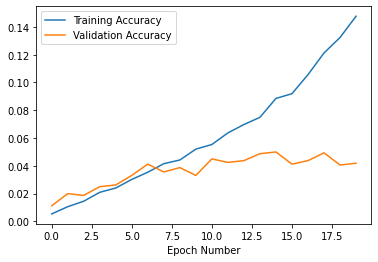

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_12.history['accuracy'],label='Training Accuracy')
plt.plot(history_12.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

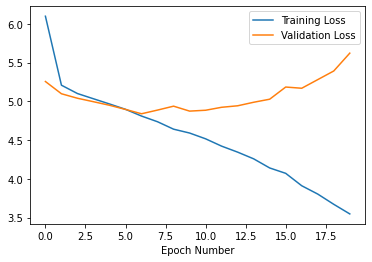

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_12.history['loss'],label='Training Loss')
plt.plot(history_12.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_12.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_12_results = model_12.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_12_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_12_results[2])
f1 = 2 * model_12_results[4] * model_12_results[3] / (model_12_results[4] + model_12_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 41s 320ms/step - loss: 5.0405 - categorical_accuracy: 0.0438 - top_k_categorical_accuracy: 0.0990 - recall: 0.0058 - precision: 0.2848
Categorical_Accuracy:  0.04377565160393715
Top_K_Categorical_Accuracy(k=3):  0.09899266064167023
F1-score:  0.011455033140305786


In [ ]:
model_12.save('/content/drive/Shareddrives/ML/MLP/model_12')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_12/assets


In [ ]:
model_12 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_12')

In [ ]:
model_12.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_12_results = model_12.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_12_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_12_results[2])
f1 = 2 * model_12_results[4] * model_12_results[3] / (model_12_results[4] + model_12_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 67s 325ms/step - loss: 3.9900 - categorical_accuracy: 0.1046 - top_k_categorical_accuracy: 0.2231 - recall_10: 0.0127 - precision_10: 0.5978
Categorical_Accuracy:  0.10463953018188477
Top_K_Categorical_Accuracy(k=3):  0.22305147349834442
F1-score:  0.024862502230581143


In [ ]:
model_12.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_12_results = model_12.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_12_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_12_results[2])
f1 = 2 * model_12_results[4] * model_12_results[3] / (model_12_results[4] + model_12_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 8s 307ms/step - loss: 5.0290 - categorical_accuracy: 0.0497 - top_k_categorical_accuracy: 0.1142 - recall_11: 0.0049 - precision_11: 0.1951
Categorical_Accuracy:  0.049723755568265915
Top_K_Categorical_Accuracy(k=3):  0.11418047547340393
F1-score:  0.009580838183489941


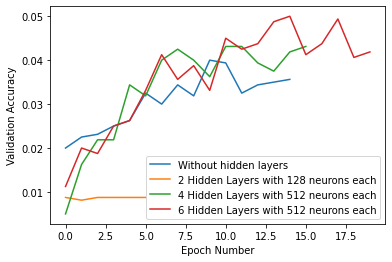

In [ ]:
plt.xlabel('Epoch Number')
plt.ylabel("Validation Accuracy")
plt.plot(history_4.history['val_accuracy'],label='Without hidden layers')
plt.plot(history.history['val_accuracy'],label='2 Hidden Layers with 128 neurons each')
plt.plot(history_2.history['val_accuracy'],label='4 Hidden Layers with 512 neurons each')
plt.plot(history_12.history['val_accuracy'],label='6 Hidden Layers with 512 neurons each')
plt.legend()

**Round 6 Experiment:**Increase number of hidden layers imrpove the training accuracy, but the validation accuracy differences is minor. Also, early stopping occurs where the model will stopped because validation accuracy remains stagnant. <br>

After several round of experiments, we believe that MLP is not suitable to perform image classfication on images that is relatively larger in size(224x224x3) because it contains too much information for MLP to perform. 

# Error Analysis on Best MLP Model

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/Shareddrives/ML/MLP/model_12')

In [ ]:
import numpy as np

predictions = model.predict(test_datagen)
pred = np.argmax(predictions, axis=1)
errors = pred == test_datagen.classes

In [ ]:
test_datagen.classes

array([  0,   0,   0, ..., 195, 195, 195], dtype=int32)

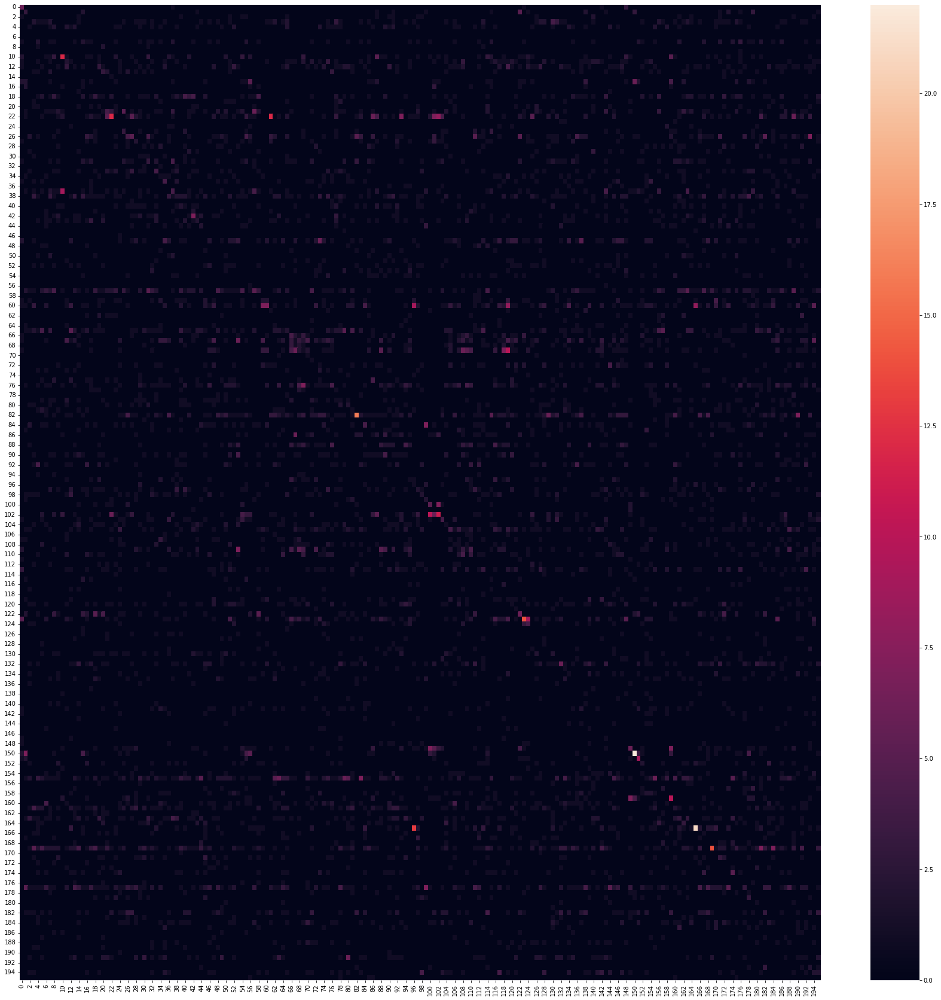

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
plt.figure(figsize=(30, 30))
sns.heatmap(confusion_matrix(pred, test_datagen.classes))

In [ ]:
pred

array([  2, 113,  15, ..., 169, 135,  98])

In [ ]:
test_datagen.classes

array([  0,   0,   0, ..., 195, 195, 195], dtype=int32)

In [ ]:
len(test_datagen.filenames)

8041

ValueError: ignored

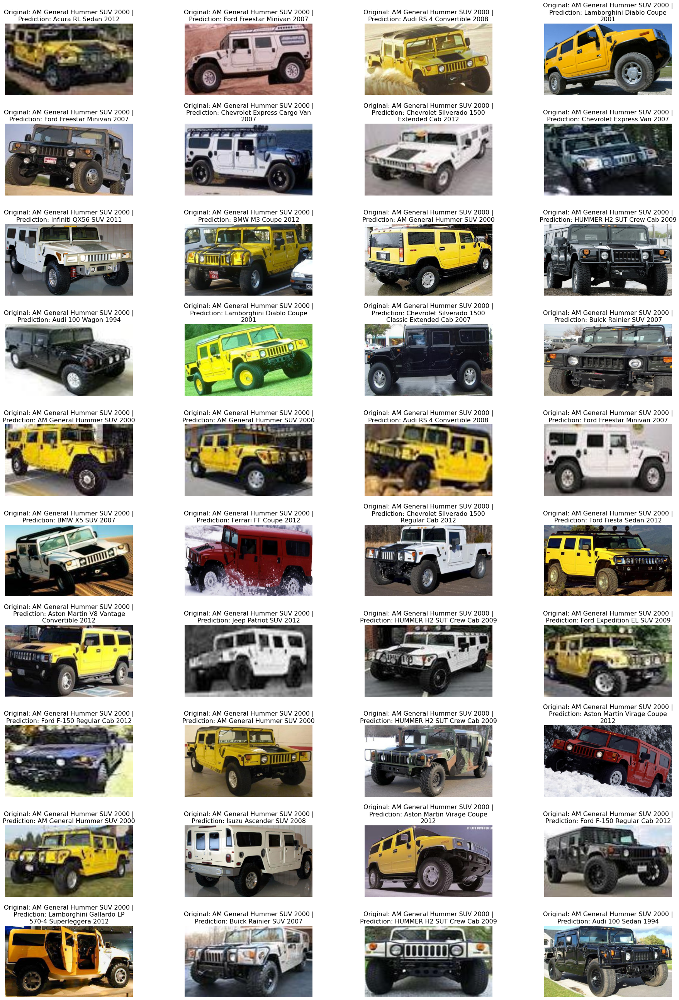

In [ ]:
# from PIL import Image
# from os.path import join
# import IPython.display as display
# import cv2
# from textwrap import wrap

# # create figure
# fig = plt.figure(figsize=(30, 50))
# plt.subplots_adjust(left=0.1,
#                     bottom=0.5, 
#                     right=0.9, 
#                     top=1.2, 
#                     wspace=0.4, 
#                     hspace=0.4)
# # fig.tight_layout()
# # setting values to rows and column variables
# rows = 10
# columns = 4

# label_mapping = {y: x for x, y in test_datagen.class_indices.items()}
# counter = 0
# for i in range(len(errors)):
#   if errors[i] == False:
#     im = cv2.imread(join('test', test_datagen.filenames[i]))
#     im = cv2.resize(im, (400, 224))
    
#     fig.add_subplot(rows, columns, counter + 1).set_title("\n".join(wrap(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', width=40)), fontdict={'fontsize':16})
#     plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
#     # plt.title(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', fontdict={'fontsize':14}, wrap=True)
#     plt.axis('off')
#     # print(f'Original: {label_mapping[test_datagen.classes[i]]}')
#     # print(f'Prediction: {label_mapping[pred[i]]}')
#     counter += 1
#     if counter == 40:
#       break
from PIL import Image
from os.path import join
import IPython.display as display
import cv2
from textwrap import wrap

# create figure
fig = plt.figure(figsize=(30, 50))
plt.subplots_adjust(left=0.1,
                    bottom=0.5, 
                    right=0.9, 
                    top=1.2, 
                    wspace=0.4, 
                    hspace=0.4)
# fig.tight_layout()
# setting values to rows and column variables
rows = 10
columns = 4

label_mapping = {y: x for x, y in test_datagen.class_indices.items()}
counter = 0
even_counter = 100
for i in range(len(errors)):
  #if errors[i] == False and even_counter % 100 == 0:
  if True:
    im = cv2.imread(join('test', test_datagen.filenames[i]))
    im = cv2.resize(im, (400, 224))
    
    fig.add_subplot(rows, columns, counter + 1).set_title("\n".join(wrap(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', width=40)), fontdict={'fontsize':16})
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    # plt.title(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', fontdict={'fontsize':14}, wrap=True)
    plt.axis('off')
    # print(f'Original: {label_mapping[test_datagen.classes[i]]}')
    # print(f'Prediction: {label_mapping[pred[i]]}')
    counter += 1
    if counter == 1000:
      break
  even_counter += 1


# CNN Models

## CNN Model 1<br>
3 layers CNN with linear activation function <br>
Without Dropout<br>
Adam Optimizer with 0.001 learning rate<br>
Train for 10 epochs

In [ ]:
import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from tensorflow.keras.metrics import CategoricalAccuracy, TopKCategoricalAccuracy, Precision, Recall
model_6 = Sequential()
model_6 .add(Conv2D(32, kernel_size=(3, 3),activation='linear',input_shape=(224,224,3),padding='same'))
model_6 .add(LeakyReLU(alpha=0.1))
model_6 .add(MaxPooling2D((2, 2),padding='same'))
model_6 .add(Conv2D(64, (3, 3), activation='linear',padding='same'))
model_6 .add(LeakyReLU(alpha=0.1))
model_6 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_6 .add(Conv2D(128, (3, 3), activation='linear',padding='same'))
model_6 .add(LeakyReLU(alpha=0.1))                  
model_6 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_6 .add(Flatten())
model_6 .add(Dense(128, activation='linear'))
model_6 .add(LeakyReLU(alpha=0.1))                  
model_6 .add(Dense(196, activation='softmax'))


In [ ]:
model_6.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])


In [ ]:
print(model_6.summary())

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_28 (Conv2D)          (None, 224, 224, 32)      896       
                                                                 
 leaky_re_lu_39 (LeakyReLU)  (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_29 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 leaky_re_lu_40 (LeakyReLU)  (None, 112, 112, 64)      0         
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                                

In [ ]:
history_6 = model_6.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 70s 342ms/step - loss: 5.2301 - accuracy: 0.0145 - val_loss: 5.0286 - val_accuracy: 0.0250
Epoch 2/10
203/203 [==============================] - 69s 340ms/step - loss: 4.2935 - accuracy: 0.1275 - val_loss: 4.3408 - val_accuracy: 0.1131
Epoch 3/10
203/203 [==============================] - 69s 339ms/step - loss: 2.2682 - accuracy: 0.4967 - val_loss: 4.6359 - val_accuracy: 0.1287
Epoch 4/10
203/203 [==============================] - 69s 340ms/step - loss: 0.9355 - accuracy: 0.7827 - val_loss: 4.7384 - val_accuracy: 0.1713
Epoch 5/10
203/203 [==============================] - 69s 338ms/step - loss: 0.3903 - accuracy: 0.9103 - val_loss: 5.5546 - val_accuracy: 0.1737
Epoch 6/10
203/203 [==============================] - 69s 338ms/step - loss: 0.1964 - accuracy: 0.9556 - val_loss: 5.6824 - val_accuracy: 0.1731
Epoch 7/10
203/203 [==============================] - 70s 346ms/step - loss: 0.1083 - accuracy: 0.9776 - val_loss: 6.3576 - val_ac

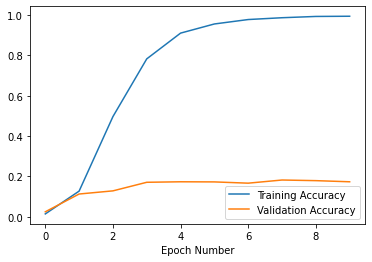

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_6.history['accuracy'],label='Training Accuracy')
plt.plot(history_6.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

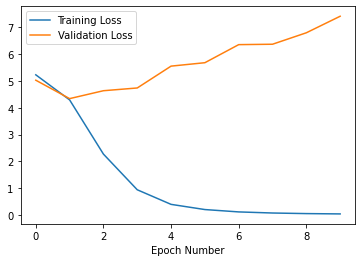

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_6.history['loss'],label='Training Loss')
plt.plot(history_6.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_6.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_6_results = model_6.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_6_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_6_results[2])
f1 = 2 * model_6_results[4] * model_6_results[3] / (model_6_results[4] + model_6_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 35s 274ms/step - loss: 7.4235 - categorical_accuracy: 0.1770 - top_k_categorical_accuracy: 0.3154 - recall_4: 0.1545 - precision_4: 0.2093
Categorical_Accuracy:  0.1769680380821228
Top_K_Categorical_Accuracy(k=3):  0.3153836727142334
F1-score:  0.17773326077049345


In [ ]:
model_6.save('/content/drive/Shareddrives/ML/MLP/model_6')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_6/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_6/assets


In [ ]:
model_6 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_6')

In [ ]:
model_6.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_6_results = model_6.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_6_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_6_results[2])
f1 = 2 * model_6_results[4] * model_6_results[3] / (model_6_results[4] + model_6_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 78s 343ms/step - loss: 0.0367 - categorical_accuracy: 0.9930 - top_k_categorical_accuracy: 0.9988 - recall_12: 0.9915 - precision_12: 0.9938
Categorical_Accuracy:  0.9929983615875244
Top_K_Categorical_Accuracy(k=3):  0.9988458752632141
F1-score:  0.9926821747413205


In [ ]:
model_6.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_6_results = model_6.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_6_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_6_results[2])
f1 = 2 * model_6_results[4] * model_6_results[3] / (model_6_results[4] + model_6_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 9s 348ms/step - loss: 7.5077 - categorical_accuracy: 0.1750 - top_k_categorical_accuracy: 0.3051 - recall_13: 0.1516 - precision_13: 0.2079
Categorical_Accuracy:  0.17495395243167877
Top_K_Categorical_Accuracy(k=3):  0.3050951361656189
F1-score:  0.17536386355936737


**Round 1 Experiment:**
Overfitting occurs. Try adding Dropout to reduce overfitting. 

## CNN Model 2<br>
3 layers CNN with linear activation function<br>
Added 0.2 Dropout within hidden layers<br>
Adam Optimizer with 0.001 learning rate<br>
Train for 10 epochs

In [ ]:
model_7 = Sequential()
model_7 .add(Conv2D(32, kernel_size=(3, 3),activation='linear',input_shape=(224,224,3),padding='same'))
model_7 .add(LeakyReLU(alpha=0.1))
model_7 .add(MaxPooling2D((2, 2),padding='same'))
model_7 .add(Dropout(0.2))
model_7 .add(Conv2D(64, (3, 3), activation='linear',padding='same'))
model_7 .add(LeakyReLU(alpha=0.1))
model_7 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_7 .add(Dropout(0.2))
model_7 .add(Conv2D(128, (3, 3), activation='linear',padding='same'))
model_7 .add(LeakyReLU(alpha=0.1))                  
model_7 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_7 .add(Dropout(0.2))
model_7 .add(Flatten())
model_7 .add(Dense(128, activation='linear'))
model_7 .add(LeakyReLU(alpha=0.1))                  
model_7 .add(Dense(196, activation='softmax'))

In [ ]:
model_7.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])

In [ ]:
print(model_7.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 112, 112, 32)     0         
 2D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 112, 112, 32)      0         
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 112, 112, 64)      0         
                                                      

In [ ]:
history_7 = model_7.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 84s 353ms/step - loss: 5.2578 - accuracy: 0.0103 - val_loss: 5.1253 - val_accuracy: 0.0213
Epoch 2/10
203/203 [==============================] - 71s 347ms/step - loss: 4.8379 - accuracy: 0.0551 - val_loss: 4.6590 - val_accuracy: 0.0694
Epoch 3/10
203/203 [==============================] - 68s 336ms/step - loss: 3.3232 - accuracy: 0.2825 - val_loss: 4.3031 - val_accuracy: 0.1544
Epoch 4/10
203/203 [==============================] - 68s 336ms/step - loss: 1.6202 - accuracy: 0.6305 - val_loss: 4.7091 - val_accuracy: 0.1737
Epoch 5/10
203/203 [==============================] - 71s 350ms/step - loss: 0.6985 - accuracy: 0.8334 - val_loss: 5.4403 - val_accuracy: 0.1844
Epoch 6/10
203/203 [==============================] - 74s 362ms/step - loss: 0.3639 - accuracy: 0.9170 - val_loss: 5.7901 - val_accuracy: 0.1919
Epoch 7/10
203/203 [==============================] - 72s 353ms/step - loss: 0.1911 - accuracy: 0.9558 - val_loss: 6.3256 - val_ac

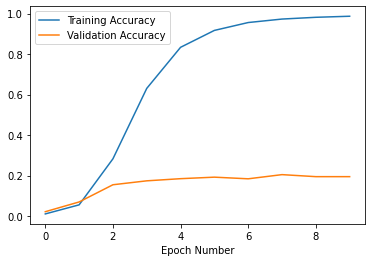

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_7.history['accuracy'],label='Training Accuracy')
plt.plot(history_7.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

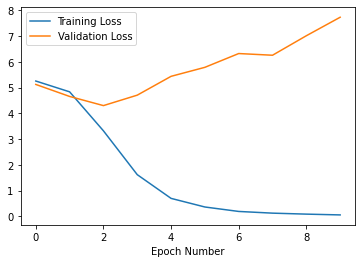

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_7.history['loss'],label='Training Loss')
plt.plot(history_7.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_7.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_7_results = model_7.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_7_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_7_results[2])
f1 = 2 * model_7_results[4] * model_7_results[3] / (model_7_results[4] + model_7_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 35s 272ms/step - loss: 7.6225 - categorical_accuracy: 0.1887 - top_k_categorical_accuracy: 0.3360 - recall_5: 0.1689 - precision_5: 0.2190
Categorical_Accuracy:  0.18865813314914703
Top_K_Categorical_Accuracy(k=3):  0.3360278606414795
F1-score:  0.19069016649150042


In [ ]:
model_7.save('/content/drive/Shareddrives/ML/MLP/model_7')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_7/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_7/assets


In [ ]:
model_7 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_7')

In [ ]:
model_7.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_7_results = model_7.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_7_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_7_results[2])
f1 = 2 * model_7_results[4] * model_7_results[3] / (model_7_results[4] + model_7_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 73s 356ms/step - loss: 0.0322 - categorical_accuracy: 0.9935 - top_k_categorical_accuracy: 0.9988 - recall_14: 0.9927 - precision_14: 0.9946
Categorical_Accuracy:  0.9935369491577148
Top_K_Categorical_Accuracy(k=3):  0.9987689256668091
F1-score:  0.9936462670812619


In [ ]:
model_7.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_7_results = model_7.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_7_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_7_results[2])
f1 = 2 * model_7_results[4] * model_7_results[3] / (model_7_results[4] + model_7_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 10s 349ms/step - loss: 7.4998 - categorical_accuracy: 0.1952 - top_k_categorical_accuracy: 0.3530 - recall_15: 0.1731 - precision_15: 0.2236
Categorical_Accuracy:  0.19521178305149078
Top_K_Categorical_Accuracy(k=3):  0.35297727584838867
F1-score:  0.19515570534421575


**Round 2 Experiment:**
Validation Accuracy improves from round 1 but overfitting still occured.

## CNN Model 3<br>
2 layers CNN with linear activation function<br>
Dropout increase from 0.2 to 0.5 within hidden layers<br>
Adam optimizers with 0.001 Learning Rate <br>
Train for 10 epochs

In [ ]:
model_8 = Sequential()
model_8 .add(Conv2D(32, kernel_size=(3, 3),activation='linear',input_shape=(224,224,3),padding='same'))
model_8 .add(LeakyReLU(alpha=0.1))
model_8 .add(MaxPooling2D((2, 2),padding='same'))
model_8 .add(Dropout(0.5))
model_8 .add(Conv2D(64, (3, 3), activation='linear',padding='same'))
model_8 .add(LeakyReLU(alpha=0.1))
model_8 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_8 .add(Dropout(0.5))
model_8 .add(Flatten())
model_8 .add(Dense(128, activation='linear'))
model_8 .add(LeakyReLU(alpha=0.1))                  
model_8 .add(Dense(196, activation='softmax'))

In [ ]:
model_8.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])

In [ ]:
print(model_8.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 224, 224, 32)      0         
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 112, 112, 32)     0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 112, 112, 32)      0         
                                                                 
 conv2d_6 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 112, 112, 64)      0         
                                                      

In [ ]:
history_8 = model_8.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 71s 347ms/step - loss: 5.6515 - accuracy: 0.0094 - val_loss: 15.7964 - val_accuracy: 0.0050
Epoch 2/10
203/203 [==============================] - 74s 366ms/step - loss: 5.0425 - accuracy: 0.0266 - val_loss: 11.8565 - val_accuracy: 0.0081
Epoch 3/10
203/203 [==============================] - 67s 331ms/step - loss: 4.6039 - accuracy: 0.0781 - val_loss: 7.6926 - val_accuracy: 0.0156
Epoch 4/10
203/203 [==============================] - 67s 332ms/step - loss: 3.3597 - accuracy: 0.2767 - val_loss: 7.1124 - val_accuracy: 0.0487
Epoch 5/10
203/203 [==============================] - 67s 327ms/step - loss: 1.9059 - accuracy: 0.5715 - val_loss: 6.4216 - val_accuracy: 0.0850
Epoch 6/10
203/203 [==============================] - 66s 327ms/step - loss: 1.0386 - accuracy: 0.7601 - val_loss: 6.4225 - val_accuracy: 0.1069
Epoch 7/10
203/203 [==============================] - 66s 327ms/step - loss: 0.5877 - accuracy: 0.8648 - val_loss: 7.0187 - val_

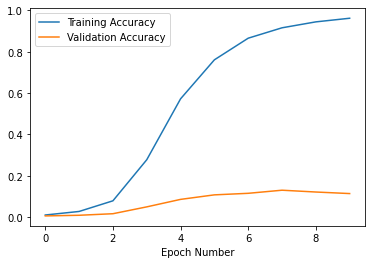

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_8.history['accuracy'],label='Training Accuracy')
plt.plot(history_8.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

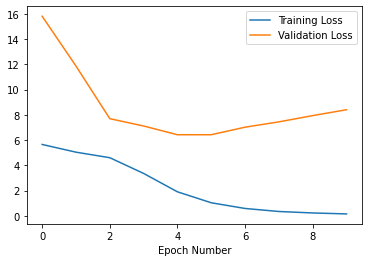

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_8.history['loss'],label='Training Loss')
plt.plot(history_8.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_8.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_8_results = model_8.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_8_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_8_results[2])
f1 = 2 * model_8_results[4] * model_8_results[3] / (model_8_results[4] + model_8_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 34s 271ms/step - loss: 8.4324 - categorical_accuracy: 0.1209 - top_k_categorical_accuracy: 0.2375 - recall_6: 0.1050 - precision_6: 0.1482
Categorical_Accuracy:  0.12088048458099365
Top_K_Categorical_Accuracy(k=3):  0.23753264546394348
F1-score:  0.1228887548158178


In [ ]:
model_8.save('/content/drive/Shareddrives/ML/MLP/model_8')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_8/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_8/assets


In [ ]:
model_8 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_8')

In [ ]:
model_8.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_8_results = model_8.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_8_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_8_results[2])
f1 = 2 * model_8_results[4] * model_8_results[3] / (model_8_results[4] + model_8_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 71s 343ms/step - loss: 0.1842 - categorical_accuracy: 0.9484 - top_k_categorical_accuracy: 0.9884 - recall_16: 0.9391 - precision_16: 0.9611
Categorical_Accuracy:  0.9483727216720581
Top_K_Categorical_Accuracy(k=3):  0.9883819222450256
F1-score:  0.9499941555496999


In [ ]:
model_8.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_8_results = model_8.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_8_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_8_results[2])
f1 = 2 * model_8_results[4] * model_8_results[3] / (model_8_results[4] + model_8_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 11s 391ms/step - loss: 8.3562 - categorical_accuracy: 0.1246 - top_k_categorical_accuracy: 0.2388 - recall_17: 0.1025 - precision_17: 0.1456
Categorical_Accuracy:  0.12461633235216141
Top_K_Categorical_Accuracy(k=3):  0.23879681527614594
F1-score:  0.12031700140038831


**Round 3 Experiment:**
By reducing number of layers, we were expecting to resolve overfit issues but overfit issues still remain. 

## CNN Model 4<br>

1 layer CNN without dropout <br>
Adam optimizer 0.001 learning rate<br>
Train for 10 epochs

In [ ]:
model_9 = Sequential()
model_9 .add(Conv2D(3, kernel_size=(3, 3),activation='linear',input_shape=(224,224,3),padding='same'))
model_9 .add(LeakyReLU(alpha=0.1))
model_9 .add(MaxPooling2D((2, 2),padding='same'))
model_9 .add(Flatten())
model_9 .add(Dense(128, activation='linear'))
model_9 .add(LeakyReLU(alpha=0.1))                  
model_9 .add(Dense(196, activation='softmax'))

In [ ]:
model_9.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])

In [ ]:
print(model_9.summary())

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 224, 224, 3)       84        
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 224, 224, 3)       0         
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 112, 112, 3)      0         
 2D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 37632)             0         
                                                                 
 dense_8 (Dense)             (None, 128)               4817024   
                                                                 
 leaky_re_lu_14 (LeakyReLU)  (None, 128)               0         
                                                      

In [ ]:
history_9 = model_9.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 63s 308ms/step - loss: 5.7110 - accuracy: 0.0095 - val_loss: 5.1692 - val_accuracy: 0.0194
Epoch 2/10
203/203 [==============================] - 62s 304ms/step - loss: 4.9879 - accuracy: 0.0445 - val_loss: 5.0772 - val_accuracy: 0.0425
Epoch 3/10
203/203 [==============================] - 62s 304ms/step - loss: 3.9246 - accuracy: 0.2184 - val_loss: 5.0795 - val_accuracy: 0.0700
Epoch 4/10
203/203 [==============================] - 62s 304ms/step - loss: 2.4833 - accuracy: 0.5006 - val_loss: 5.3528 - val_accuracy: 0.0662
Epoch 5/10
203/203 [==============================] - 62s 304ms/step - loss: 1.4232 - accuracy: 0.7129 - val_loss: 6.2414 - val_accuracy: 0.0475
Epoch 6/10
203/203 [==============================] - 62s 304ms/step - loss: 0.8273 - accuracy: 0.8365 - val_loss: 6.4242 - val_accuracy: 0.0644
Epoch 7/10
203/203 [==============================] - 62s 304ms/step - loss: 0.5243 - accuracy: 0.8996 - val_loss: 6.8274 - val_ac

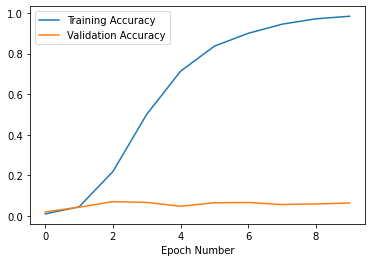

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_9.history['accuracy'],label='Training Accuracy')
plt.plot(history_9.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

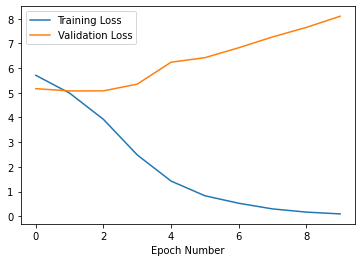

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_9.history['loss'],label='Training Loss')
plt.plot(history_9.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_9.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_9_results = model_9.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_9_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_9_results[2])
f1 = 2 * model_9_results[4] * model_9_results[3] / (model_9_results[4] + model_9_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 34s 264ms/step - loss: 8.0801 - categorical_accuracy: 0.0632 - top_k_categorical_accuracy: 0.1352 - recall_7: 0.0434 - precision_7: 0.0890
Categorical_Accuracy:  0.0631762221455574
Top_K_Categorical_Accuracy(k=3):  0.135182186961174
F1-score:  0.058341689339122364


In [ ]:
model_9.save('/content/drive/Shareddrives/ML/MLP/model_9')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_9/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_9/assets


In [ ]:
model_9 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_9')

In [ ]:
model_9.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_9_results = model_9.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_9_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_9_results[2])
f1 = 2 * model_9_results[4] * model_9_results[3] / (model_9_results[4] + model_9_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 69s 334ms/step - loss: 0.0694 - categorical_accuracy: 0.9871 - top_k_categorical_accuracy: 0.9952 - recall_18: 0.9807 - precision_18: 0.9936
Categorical_Accuracy:  0.9870739579200745
Top_K_Categorical_Accuracy(k=3):  0.9951527118682861
F1-score:  0.9871055337855704


In [ ]:
model_9.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_9_results = model_9.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_9_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_9_results[2])
f1 = 2 * model_9_results[4] * model_9_results[3] / (model_9_results[4] + model_9_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 9s 334ms/step - loss: 8.1315 - categorical_accuracy: 0.0681 - top_k_categorical_accuracy: 0.1375 - recall_19: 0.0510 - precision_19: 0.1031
Categorical_Accuracy:  0.06813996285200119
Top_K_Categorical_Accuracy(k=3):  0.13750767707824707
F1-score:  0.06820049225432277


**Round 4 Experiment:**
Reduced layers to 1. Overfitting issues get worsed.

## CNN Model 5<br>

3 layers CNN RELU activation function <br>
0.2 Dropout<br>
Adam optimizer 0.0001 Learning Rate<br>
30 epochs (Val accuracy remains stagnant after 15 epochs)

In [ ]:
model_10 = Sequential()
model_10 .add(Conv2D(128, kernel_size=(3, 3),activation='relu',input_shape=(224,224,3),padding='same'))
model_10 .add(LeakyReLU(alpha=0.1))
model_10 .add(MaxPooling2D((2, 2),padding='same'))
model_10 .add(Dropout(0.2))
model_10 .add(Conv2D(64, (3, 3), activation='relu',padding='same'))
model_10 .add(LeakyReLU(alpha=0.1))
model_10 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_10 .add(Dropout(0.2))
model_10 .add(Conv2D(32, (3, 3), activation='relu',padding='same'))
model_10 .add(LeakyReLU(alpha=0.1))                  
model_10 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_10 .add(Dropout(0.2))
model_10 .add(Flatten())
model_10 .add(Dense(128, activation='relu'))
model_10 .add(LeakyReLU(alpha=0.1))                  
model_10 .add(Dense(196, activation='softmax'))

In [ ]:
model_10.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),metrics=['accuracy'])

In [ ]:
print(model_10.summary())

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 224, 224, 128)     3584      
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 224, 224, 128)     0         
                                                                 
 max_pooling2d_22 (MaxPoolin  (None, 112, 112, 128)    0         
 g2D)                                                            
                                                                 
 dropout_19 (Dropout)        (None, 112, 112, 128)     0         
                                                                 
 conv2d_23 (Conv2D)          (None, 112, 112, 64)      73792     
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 112, 112, 64)      0         
                                                     

In [ ]:
history_10 = model_10.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 85s 416ms/step - loss: 5.2694 - accuracy: 0.0064 - val_loss: 5.2304 - val_accuracy: 0.0100
Epoch 2/10
203/203 [==============================] - 84s 414ms/step - loss: 5.1970 - accuracy: 0.0131 - val_loss: 5.1483 - val_accuracy: 0.0156
Epoch 3/10
203/203 [==============================] - 83s 409ms/step - loss: 5.0990 - accuracy: 0.0255 - val_loss: 5.0941 - val_accuracy: 0.0250
Epoch 4/10
203/203 [==============================] - 82s 405ms/step - loss: 4.9759 - accuracy: 0.0418 - val_loss: 5.0082 - val_accuracy: 0.0375
Epoch 5/10
203/203 [==============================] - 82s 405ms/step - loss: 4.7911 - accuracy: 0.0628 - val_loss: 4.9134 - val_accuracy: 0.0450
Epoch 6/10
203/203 [==============================] - 82s 405ms/step - loss: 4.4752 - accuracy: 0.1036 - val_loss: 4.7854 - val_accuracy: 0.0606
Epoch 7/10
203/203 [==============================] - 83s 406ms/step - loss: 4.0996 - accuracy: 0.1495 - val_loss: 4.7627 - val_ac

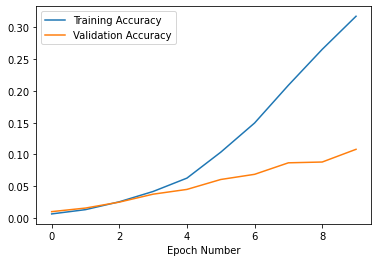

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_10.history['accuracy'],label='Training Accuracy')
plt.plot(history_10.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

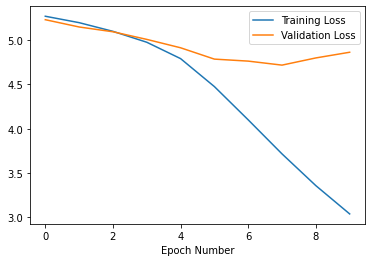

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_10.history['loss'],label='Training Loss')
plt.plot(history_10.history['val_loss'],label='Validation Loss')
plt.legend()

### Train For 20 more epochs

In [ ]:
history_10 = model_10.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=20, shuffle=True,verbose=1)

Epoch 1/20
203/203 [==============================] - 85s 415ms/step - loss: 2.6921 - accuracy: 0.3919 - val_loss: 4.8351 - val_accuracy: 0.0956
Epoch 2/20
203/203 [==============================] - 84s 411ms/step - loss: 2.3977 - accuracy: 0.4478 - val_loss: 5.0467 - val_accuracy: 0.0981
Epoch 3/20
203/203 [==============================] - 83s 410ms/step - loss: 2.1227 - accuracy: 0.5010 - val_loss: 5.1957 - val_accuracy: 0.0988
Epoch 4/20
203/203 [==============================] - 88s 431ms/step - loss: 1.8683 - accuracy: 0.5513 - val_loss: 5.3096 - val_accuracy: 0.0956
Epoch 5/20
203/203 [==============================] - 84s 412ms/step - loss: 1.6269 - accuracy: 0.6060 - val_loss: 5.5556 - val_accuracy: 0.1081
Epoch 6/20
203/203 [==============================] - 83s 409ms/step - loss: 1.4464 - accuracy: 0.6404 - val_loss: 5.7409 - val_accuracy: 0.1031
Epoch 7/20
203/203 [==============================] - 84s 412ms/step - loss: 1.2561 - accuracy: 0.6867 - val_loss: 5.9538 - val_ac

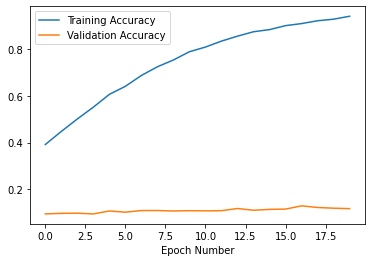

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_10.history['accuracy'],label='Training Accuracy')
plt.plot(history_10.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

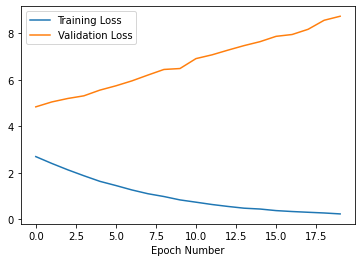

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_10.history['loss'],label='Training Loss')
plt.plot(history_10.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_10.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_10_results = model_10.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_10_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_10_results[2])
f1 = 2 * model_10_results[4] * model_10_results[3] / (model_10_results[4] + model_10_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 38s 300ms/step - loss: 8.7727 - categorical_accuracy: 0.1231 - top_k_categorical_accuracy: 0.2339 - recall_8: 0.1031 - precision_8: 0.1481
Categorical_Accuracy:  0.12311901152133942
Top_K_Categorical_Accuracy(k=3):  0.23392613232135773
F1-score:  0.12155425029727321


In [ ]:
model_10.save('/content/drive/Shareddrives/ML/MLP/model_10')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_10/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_10/assets


In [ ]:
model_10 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_10')

In [ ]:
model_10.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_10_results = model_10.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_10_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_10_results[2])
f1 = 2 * model_10_results[4] * model_10_results[3] / (model_10_results[4] + model_10_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 81s 383ms/step - loss: 0.0706 - categorical_accuracy: 0.9879 - top_k_categorical_accuracy: 0.9976 - recall_20: 0.9801 - precision_20: 0.9936
Categorical_Accuracy:  0.9879202842712402
Top_K_Categorical_Accuracy(k=3):  0.997614860534668
F1-score:  0.986791657200817


In [ ]:
model_10.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_10_results = model_10.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_10_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_10_results[2])
f1 = 2 * model_10_results[4] * model_10_results[3] / (model_10_results[4] + model_10_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 13s 486ms/step - loss: 8.7000 - categorical_accuracy: 0.1209 - top_k_categorical_accuracy: 0.2204 - recall_21: 0.1031 - precision_21: 0.1509
Categorical_Accuracy:  0.12093308568000793
Top_K_Categorical_Accuracy(k=3):  0.22038060426712036
F1-score:  0.12253829589492786


## CNN Model 6

3 layers CNN with Linear Activation Function<br>
0.2 Drop out<br>
Adam optimizer 0.01 Learning Rate<br>
10 epochs

In [ ]:
model_11 = Sequential()
model_11 .add(Conv2D(128, kernel_size=(3, 3),activation='linear',input_shape=(224,224,3),padding='same'))
model_11 .add(LeakyReLU(alpha=0.1))
model_11 .add(MaxPooling2D((2, 2),padding='same'))
model_11 .add(Dropout(0.2))
model_11 .add(Conv2D(64, (3, 3), activation='linear',padding='same'))
model_11 .add(LeakyReLU(alpha=0.1))
model_11 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_11 .add(Dropout(0.2))
model_11 .add(Conv2D(32, (3, 3), activation='linear',padding='same'))
model_11 .add(LeakyReLU(alpha=0.1))                  
model_11 .add(MaxPooling2D(pool_size=(2, 2),padding='same'))
model_11 .add(Dropout(0.2))
model_11 .add(Flatten())
model_11 .add(Dense(128, activation='linear'))
model_11 .add(LeakyReLU(alpha=0.1))                  
model_11 .add(Dense(196, activation='softmax'))

In [ ]:
model_11.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),metrics=['accuracy'])

In [ ]:
print(model_11.summary())

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 224, 224, 128)     3584      
                                                                 
 leaky_re_lu_35 (LeakyReLU)  (None, 224, 224, 128)     0         
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 112, 112, 128)    0         
 g2D)                                                            
                                                                 
 dropout_22 (Dropout)        (None, 112, 112, 128)     0         
                                                                 
 conv2d_26 (Conv2D)          (None, 112, 112, 64)      73792     
                                                                 
 leaky_re_lu_36 (LeakyReLU)  (None, 112, 112, 64)      0         
                                                     

In [ ]:
history_11 = model_11.fit(x=train_datagen, steps_per_epoch = STEP_SIZE_TRAIN, validation_data=val_datagen, validation_steps=STEP_SIZE_VALID, epochs=10, shuffle=True,verbose=1)

Epoch 1/10
203/203 [==============================] - 82s 405ms/step - loss: 112.5349 - accuracy: 0.0052 - val_loss: 62.3137 - val_accuracy: 0.0031
Epoch 2/10
203/203 [==============================] - 81s 396ms/step - loss: 22748.4141 - accuracy: 0.0061 - val_loss: 22715.2852 - val_accuracy: 0.0088
Epoch 3/10
203/203 [==============================] - 81s 400ms/step - loss: 2929.0464 - accuracy: 0.0076 - val_loss: 669.6954 - val_accuracy: 0.0069
Epoch 4/10
203/203 [==============================] - 80s 395ms/step - loss: 384.7454 - accuracy: 0.0090 - val_loss: 427.7895 - val_accuracy: 0.0100
Epoch 5/10
203/203 [==============================] - 80s 394ms/step - loss: 262.8640 - accuracy: 0.0097 - val_loss: 448.0928 - val_accuracy: 0.0050
Epoch 6/10
203/203 [==============================] - 81s 396ms/step - loss: 214.1357 - accuracy: 0.0113 - val_loss: 299.7837 - val_accuracy: 0.0075
Epoch 7/10
203/203 [==============================] - 80s 394ms/step - loss: 177.2581 - accuracy: 0.01

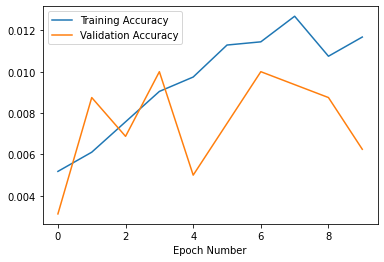

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_11.history['accuracy'],label='Training Accuracy')
plt.plot(history_11.history['val_accuracy'],label='Validation Accuracy')
plt.legend()

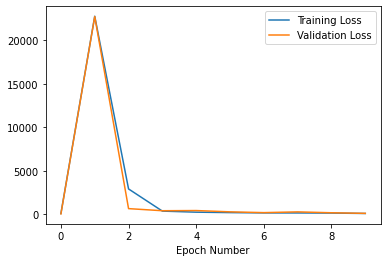

In [ ]:
plt.xlabel('Epoch Number')
plt.plot(history_11.history['loss'],label='Training Loss')
plt.plot(history_11.history['val_loss'],label='Validation Loss')
plt.legend()

In [ ]:
model_11.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_11_results = model_11.evaluate(test_datagen)

print("Categorical_Accuracy: ", model_11_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_11_results[2])
f1 = 2 * model_11_results[4] * model_11_results[3] / (model_11_results[4] + model_11_results[3])
print("F1-score: ", f1)

126/126 [==============================] - 37s 290ms/step - loss: 126.0337 - categorical_accuracy: 0.0082 - top_k_categorical_accuracy: 0.0225 - recall_9: 0.0082 - precision_9: 0.0083
Categorical_Accuracy:  0.008207933977246284
Top_K_Categorical_Accuracy(k=3):  0.022509638220071793
F1-score:  0.008229426029741386


In [ ]:
model_11.save('/content/drive/Shareddrives/ML/MLP/model_11')

INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_11/assets


INFO:tensorflow:Assets written to: /content/drive/Shareddrives/ML/MLP/model_11/assets


In [ ]:
model_11 = keras.models.load_model('/content/drive/Shareddrives/ML/MLP/model_11')

In [ ]:
model_11.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_11_results = model_11.evaluate(train_datagen)

print("Categorical_Accuracy: ", model_11_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_11_results[2])
f1 = 2 * model_11_results[4] * model_11_results[3] / (model_11_results[4] + model_11_results[3])
print("F1-score: ", f1)

204/204 [==============================] - 80s 388ms/step - loss: 125.6210 - categorical_accuracy: 0.0096 - top_k_categorical_accuracy: 0.0273 - recall_22: 0.0095 - precision_22: 0.0096
Categorical_Accuracy:  0.009617604315280914
Top_K_Categorical_Accuracy(k=3):  0.027313996106386185
F1-score:  0.009565686660082423


In [ ]:
model_11.compile(loss=keras.losses.categorical_crossentropy, optimizer=tf.keras.optimizers.Adam(), metrics=[CategoricalAccuracy(), TopKCategoricalAccuracy(k=3), Recall(), Precision()])
model_11_results = model_11.evaluate(val_datagen)

print("Categorical_Accuracy: ", model_11_results[1])
print("Top_K_Categorical_Accuracy(k=3): ", model_11_results[2])
f1 = 2 * model_11_results[4] * model_11_results[3] / (model_11_results[4] + model_11_results[3])
print("F1-score: ", f1)

26/26 [==============================] - 11s 407ms/step - loss: 124.9908 - categorical_accuracy: 0.0074 - top_k_categorical_accuracy: 0.0209 - recall_23: 0.0074 - precision_23: 0.0074
Categorical_Accuracy:  0.007366482634097338
Top_K_Categorical_Accuracy(k=3):  0.02087170071899891
F1-score:  0.00738461544353528


**Round 6 Experiment:** 0.01 Learning rate is too high for the CNN to learn. The model fails to learn. 

# Error Analysis on Best CNN Model

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/Shareddrives/ML/MLP/model_7')

In [ ]:
import numpy as np

predictions = model.predict(test_datagen)
pred = np.argmax(predictions, axis=1)
errors = pred == test_datagen.classes

In [ ]:
test_datagen.classes

array([  0,   0,   0, ..., 195, 195, 195], dtype=int32)

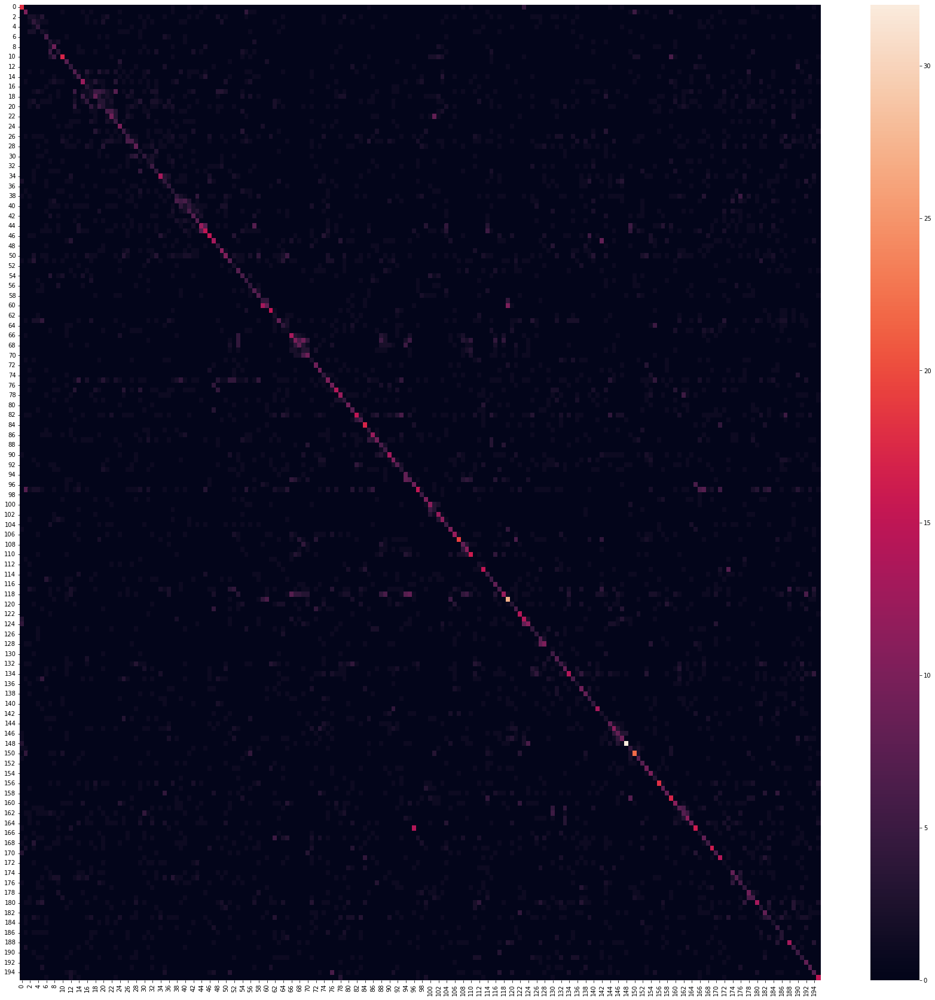

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
plt.figure(figsize=(30, 30))
sns.heatmap(confusion_matrix(pred, test_datagen.classes))

In [ ]:
pred

array([124, 165,   0, ..., 163,  78, 195])

In [ ]:
test_datagen.classes

array([  0,   0,   0, ..., 195, 195, 195], dtype=int32)

In [ ]:
len(test_datagen.filenames)

8041

ValueError: ignored

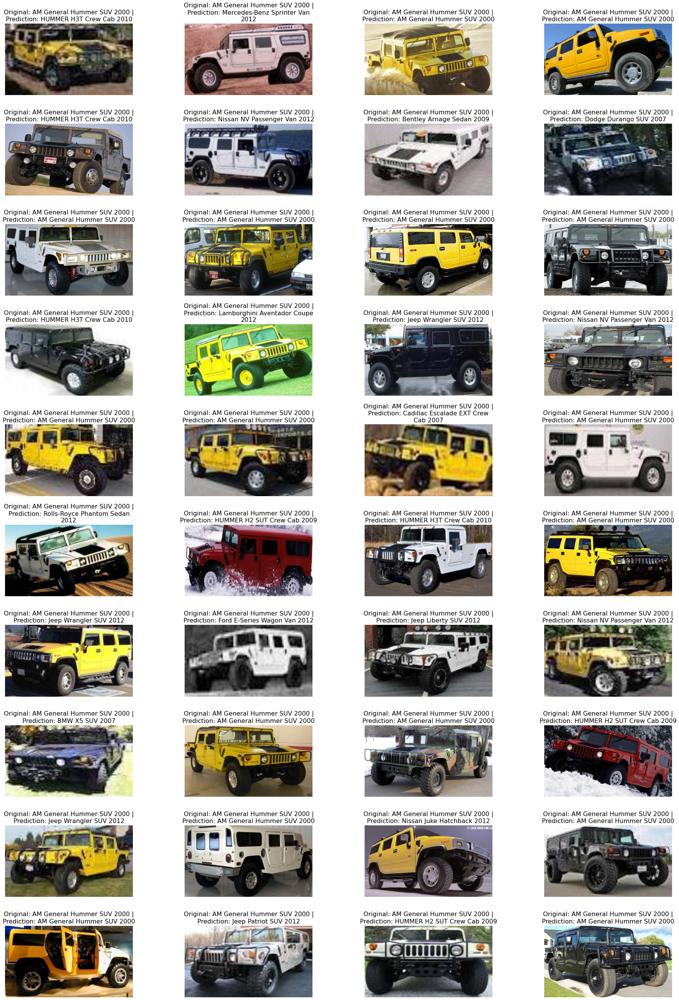

In [ ]:
# from PIL import Image
# from os.path import join
# import IPython.display as display
# import cv2
# from textwrap import wrap

# # create figure
# fig = plt.figure(figsize=(30, 50))
# plt.subplots_adjust(left=0.1,
#                     bottom=0.5, 
#                     right=0.9, 
#                     top=1.2, 
#                     wspace=0.4, 
#                     hspace=0.4)
# # fig.tight_layout()
# # setting values to rows and column variables
# rows = 10
# columns = 4

# label_mapping = {y: x for x, y in test_datagen.class_indices.items()}
# counter = 0
# for i in range(len(errors)):
#   if errors[i] == False:
#     im = cv2.imread(join('test', test_datagen.filenames[i]))
#     im = cv2.resize(im, (400, 224))
    
#     fig.add_subplot(rows, columns, counter + 1).set_title("\n".join(wrap(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', width=40)), fontdict={'fontsize':16})
#     plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
#     # plt.title(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', fontdict={'fontsize':14}, wrap=True)
#     plt.axis('off')
#     # print(f'Original: {label_mapping[test_datagen.classes[i]]}')
#     # print(f'Prediction: {label_mapping[pred[i]]}')
#     counter += 1
#     if counter == 40:
#       break
from PIL import Image
from os.path import join
import IPython.display as display
import cv2
from textwrap import wrap

# create figure
fig = plt.figure(figsize=(30, 50))
plt.subplots_adjust(left=0.1,
                    bottom=0.5, 
                    right=0.9, 
                    top=1.2, 
                    wspace=0.4, 
                    hspace=0.4)
# fig.tight_layout()
# setting values to rows and column variables
rows = 10
columns = 4

label_mapping = {y: x for x, y in test_datagen.class_indices.items()}
counter = 0
even_counter = 100
for i in range(len(errors)):
  #if errors[i] == True and even_counter % 100 == 0:
  if True:
    im = cv2.imread(join('test', test_datagen.filenames[i]))
    im = cv2.resize(im, (400, 224))
    
    fig.add_subplot(rows, columns, counter + 1).set_title("\n".join(wrap(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', width=40)), fontdict={'fontsize':16})
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    # plt.title(f'Original: {label_mapping[test_datagen.classes[i]]} | \n' + f'Prediction: {label_mapping[pred[i]]}', fontdict={'fontsize':14}, wrap=True)
    plt.axis('off')
    # print(f'Original: {label_mapping[test_datagen.classes[i]]}')
    # print(f'Prediction: {label_mapping[pred[i]]}')
    counter += 1
    if counter == 1000:
      break
  even_counter += 1